In [ ]:
import pandas as pd
import numpy as np

import os

: 

In [100]:
df = pd.read_csv(os.getcwd() + '\\..\\..\\data\\final\\FinalFE2.csv')
df.head()

,ObjectOfInterest,Disposition,OrbitalPeriod,PlanetEarthRadius,PlanetEquilibriumTemperature,PlanetInsolationValue,StellarEffectiveTemperature,StellarLogG,StellarSunRadius,RightAscension,Declination,PlanetType,PlanetName,StellarSunLuminosity,DistanceFromStarCoreinAU,StarClassification,MainSequence
0,K00010.01,CFRM,3.522498,14.59,1521.0,1264.67,6225.0,4.169,1.451,281.28812,42.451080,Gas Giant,Kepler-8 b,1.956210,0.001488,F,0
1,K00791.01,CFRM,12.611904,7.40,753.0,76.15,5795.0,4.508,0.919,289.11221,51.737381,Gas Giant,Kepler-682 b,0.930507,0.004182,G,0
2,K00813.01,CFRM,3.895937,7.34,1005.0,241.62,5557.0,4.592,0.774,294.65524,39.308361,Gas Giant,Kepler-688 b,0.662664,0.001981,G,0
3,K00801.01,CFRM,1.625522,9.73,1579.0,1467.41,5539.0,4.322,1.106,293.87192,38.422939,Gas Giant,Kepler-685 b,0.934698,0.000955,G,1
4,K00806.02,CFRM,60.324942,12.19,411.0,6.77,5485.0,4.556,0.867,285.28363,38.947281,Gas Giant,Kepler-30 c,0.704557,0.012204,G,0


In [101]:
df.drop(columns=['PlanetName', 'ObjectOfInterest']).describe(exclude='number')

,Disposition,PlanetType,StarClassification
count,12846,7715,12846
unique,3,6,6
top,FPOS,TBD,G
freq,5131,5050,5583


In [102]:
df.replace(np.nan, 'N/A', inplace=True)
df.head()

,ObjectOfInterest,Disposition,OrbitalPeriod,PlanetEarthRadius,PlanetEquilibriumTemperature,PlanetInsolationValue,StellarEffectiveTemperature,StellarLogG,StellarSunRadius,RightAscension,Declination,PlanetType,PlanetName,StellarSunLuminosity,DistanceFromStarCoreinAU,StarClassification,MainSequence
0,K00010.01,CFRM,3.522498,14.59,1521.0,1264.67,6225.0,4.169,1.451,281.28812,42.451080,Gas Giant,Kepler-8 b,1.956210,0.001488,F,0
1,K00791.01,CFRM,12.611904,7.40,753.0,76.15,5795.0,4.508,0.919,289.11221,51.737381,Gas Giant,Kepler-682 b,0.930507,0.004182,G,0
2,K00813.01,CFRM,3.895937,7.34,1005.0,241.62,5557.0,4.592,0.774,294.65524,39.308361,Gas Giant,Kepler-688 b,0.662664,0.001981,G,0
3,K00801.01,CFRM,1.625522,9.73,1579.0,1467.41,5539.0,4.322,1.106,293.87192,38.422939,Gas Giant,Kepler-685 b,0.934698,0.000955,G,1
4,K00806.02,CFRM,60.324942,12.19,411.0,6.77,5485.0,4.556,0.867,285.28363,38.947281,Gas Giant,Kepler-30 c,0.704557,0.012204,G,0


# Simple EDA

In [103]:
import matplotlib.pyplot as plt
import seaborn as sns

NUMERICAL_COLS = [x for x in df.columns if df[x].dtype != object]
OBJECT_COLS = [x for x in df.columns if df[x].dtype == object]

def plot(df, col, kind, figsize=(10,5), title=None, filters=None, col2=None, cat_col=None, shade=None, cat_filters=[], drop_empty=True, invert_x=False):
    vis = df.copy()
    
    if filters:
        for filt in filters:
            vis = vis[vis[col] != filt]

    if cat_filters:
        for filt in cat_filters:
            vis = vis[vis[cat_col] != filt]

    if drop_empty:
        vis = vis.dropna()

    plt.figure(figsize=figsize)
    if kind == 'dist':
        sns.kdeplot(vis[col], shade=shade)
    elif kind == 'count':
        sns.countplot(vis[col])
    elif kind == 'scatter':
        plt.scatter(vis[col], vis[col2])
    elif kind == 'cdist':
        for cat in vis[cat_col].unique():
            sns.kdeplot(vis[vis[cat_col] == cat][col], shade=shade)
    elif kind == 'cscatt':
        sns.scatterplot(x=col, y=col2, hue=cat_col, data=vis, legend=True)
        
    if title:
        plt.title(title, fontsize=14)

    if cat_col and kind != 'cscatt':
        plt.legend(vis[cat_col].unique())

    if invert_x:
        plt.gca().invert_xaxis()
    
    plt.show()

In [104]:
print(f'The Dataset has {df.shape[0]} rows and {df.shape[1]} columns.')

The Dataset has 12846 rows and 17 columns.


In [105]:
df.describe()

,OrbitalPeriod,PlanetEarthRadius,PlanetEquilibriumTemperature,PlanetInsolationValue,StellarEffectiveTemperature,StellarLogG,StellarSunRadius,RightAscension,Declination,StellarSunLuminosity,DistanceFromStarCoreinAU,MainSequence
count,12846.000000,12846.000000,12846.000000,1.284600e+04,12846.000000,12846.000000,12846.000000,12846.000000,12846.000000,12846.000000,12846.000000,12846.000000
mean,47.195754,76.558717,1162.067361,6.179973e+03,5753.996634,4.302731,1.628297,256.099297,29.633019,1.870336,0.006443,0.285147
std,115.555884,2604.959923,825.239012,1.350981e+05,920.641102,0.402343,5.200619,77.408706,35.136986,3.141677,0.010204,0.451502
min,0.184692,0.080000,92.000000,2.000000e-02,2661.000000,0.047000,0.109000,0.129574,-89.471513,0.005222,0.000047,0.000000
25%,2.521601,1.670000,613.000000,3.193250e+01,5316.700000,4.171250,0.843000,282.213805,38.535701,0.677498,0.001356,0.000000
50%,6.411742,3.290000,989.000000,2.087845e+02,5780.000000,4.410000,1.040500,290.510470,42.464510,1.148164,0.002632,0.000000
75%,21.804314,14.209425,1504.000000,1.054475e+03,6167.000000,4.532000,1.487000,295.246320,46.650546,1.875309,0.005795,1.000000
max,2190.701035,200346.000000,14667.000000,1.094755e+07,11892.000000,5.960650,229.908000,359.853101,89.086923,70.454565,0.138405,1.000000


Comparing these statistics to our Sun and Earth,

Orbital Period:
- The Mean is way less than earth's

Planet Radius (In Terms of Earths):
- The Mean is 76x the radius of Earth

Planet Equilibrium Temperature
- The Equilibrium Temperature (in K) of Earth is 255 K. The Mean is ~4.5x the equilibrium temp of Earth

Planet Insolation Flux
- Earth's Insolation Value is at around 1361 W/m^2. The Mean is Way above the Insolation Value.
- Perhaps most of the planets that we find are nearer to their stars than ours

Stellar Effective Temperature
- The Sun's Effective Temperature is ~5800 K. It seems that our sun is quite average in terms of its effective temperature

Stellar Log G
- The Sun's Gravity log_10 is about 2.44. It seems that other star's gravities are way stronger than our sun's

Stellar Sun Radius
- The Mean is about 1.6x the radius of the Sun. 


Other Values found in the DataFrame are:
- Right Ascension and Declination
    - In short, they are the coordinates of the planet system in the vast space using angles.
- Planet Type
    - The Planet Type that is specified for the planet as shown in the NASA Exoplanet Catalog Data.

In [106]:
df['Disposition'].value_counts()

FPOS    5131
CAND    5050
CFRM    2665
Name: Disposition, dtype: int64

In [107]:
df['PlanetType'].value_counts()

N/A             5131
TBD             5050
Super Earth     1165
Neptune-like    1159
Terrestrial      156
Gas Giant        153
Unknown           32
Name: PlanetType, dtype: int64

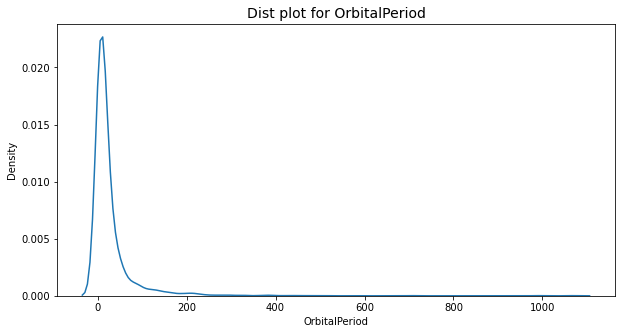

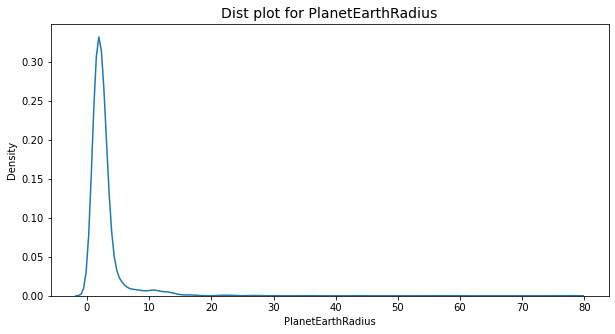

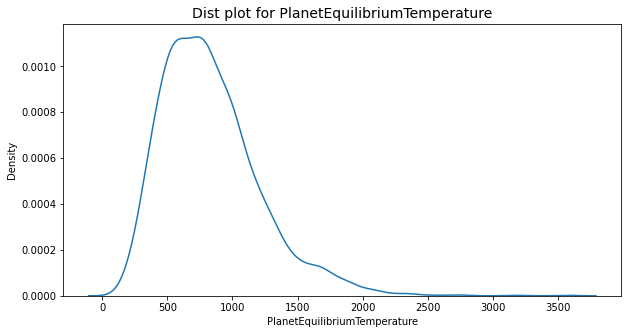

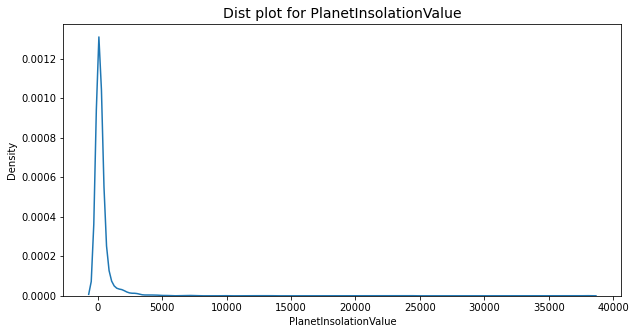

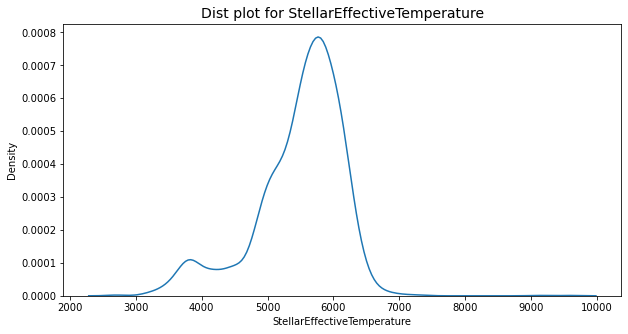

...

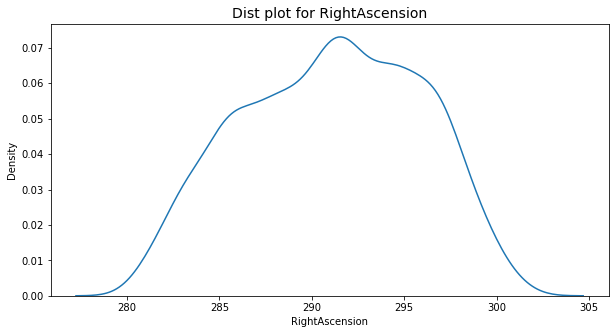

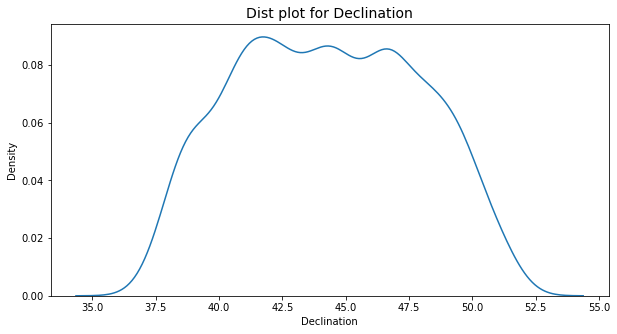

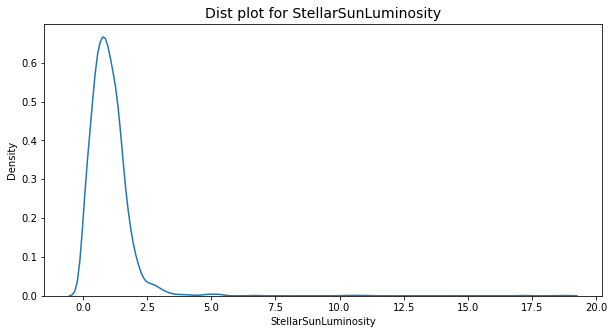

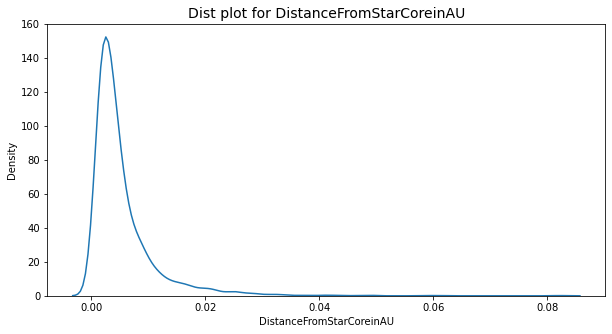

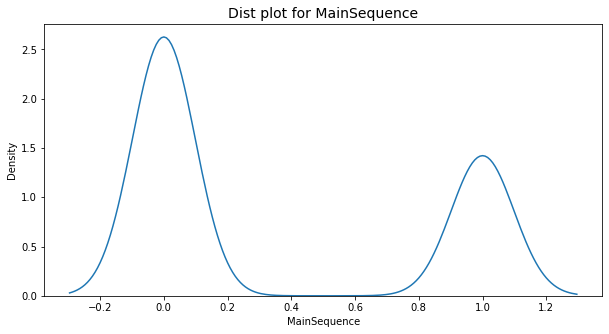

In [108]:
for ncol in NUMERICAL_COLS:
    plot(df[df['Disposition']=='CFRM'], ncol, 'dist', title=f'Dist plot for {ncol}')

# Observations

The Distributions are incredibly skewed. There may be outliers that are present.

C:\Users\paolo\anaconda3\envs\py39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


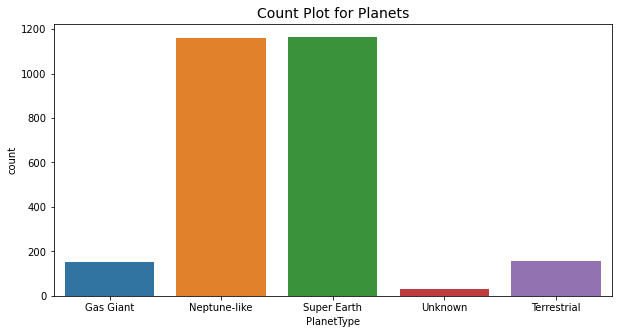

C:\Users\paolo\anaconda3\envs\py39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


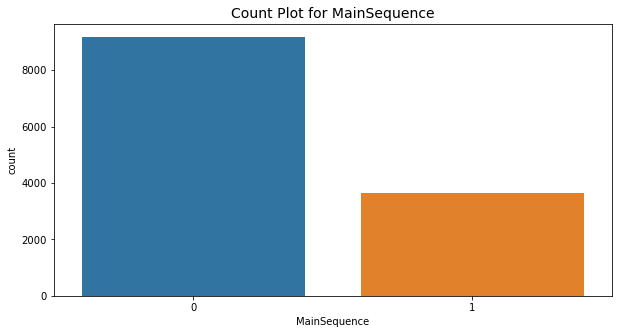

C:\Users\paolo\anaconda3\envs\py39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


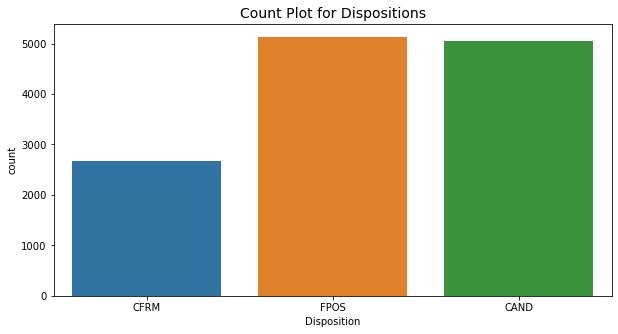

In [109]:
plot(df, 'PlanetType', 'count', title='Count Plot for Planets', filters=['TBD', 'N/A'])
plot(df, 'MainSequence', 'count', title='Count Plot for MainSequence')
plot(df, 'Disposition', 'count', title='Count Plot for Dispositions')

A Note about the Dispositions. Dispositions talk about the status of the object of interest found from the TESS and Kepler Database.

CFRM - Confirmed Exoplanets
FPOS - False Positives: Could be an eclipse or even a foreign object beyond the star's orbit like an asteroid or a comet
CAND - Unconfirmed. Can be a CFRM'd planet through analysis of the James Webb Telescope and other Telescope or FPOS after analysis

Currently, this is determined by an Algorithm.

# Anomaly Detection

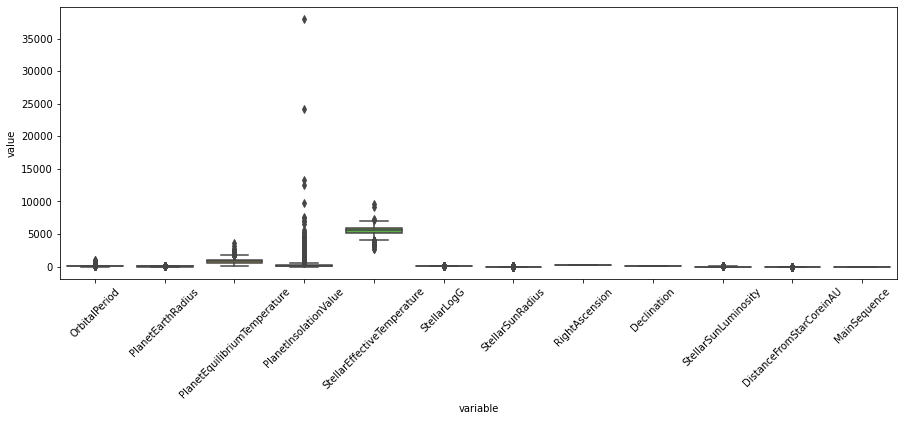

In [110]:
plt.figure(figsize=(15,5))
sns.boxplot(x='variable', y='value', data=pd.melt(df[df['Disposition']=='CFRM'][NUMERICAL_COLS]))
plt.xticks(rotation=45)
plt.show()

In [111]:
temp = df.copy()

temp

,ObjectOfInterest,Disposition,OrbitalPeriod,PlanetEarthRadius,PlanetEquilibriumTemperature,PlanetInsolationValue,StellarEffectiveTemperature,StellarLogG,StellarSunRadius,RightAscension,Declination,PlanetType,PlanetName,StellarSunLuminosity,DistanceFromStarCoreinAU,StarClassification,MainSequence
0,K00010.01,CFRM,3.522498,14.59,1521.0,1264.67,6225.0,4.169,1.451,281.28812,42.451080,Gas Giant,Kepler-8 b,1.956210,0.001488,F,0
1,K00791.01,CFRM,12.611904,7.40,753.0,76.15,5795.0,4.508,0.919,289.11221,51.737381,Gas Giant,Kepler-682 b,0.930507,0.004182,G,0
2,K00813.01,CFRM,3.895937,7.34,1005.0,241.62,5557.0,4.592,0.774,294.65524,39.308361,Gas Giant,Kepler-688 b,0.662664,0.001981,G,0
3,K00801.01,CFRM,1.625522,9.73,1579.0,1467.41,5539.0,4.322,1.106,293.87192,38.422939,Gas Giant,Kepler-685 b,0.934698,0.000955,G,1
4,K00806.02,CFRM,60.324942,12.19,411.0,6.77,5485.0,4.556,0.867,285.28363,38.947281,Gas Giant,Kepler-30 c,0.704557,0.012204,G,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12841,K00097.01,CFRM,4.885489,16.66,1496.0,1182.79,6036.0,3.968,1.909,288.58151,41.089809,Gas Giant,Kepler-7 b,2.275063,0.001659,F,0
12842,K04301.01,CFRM,15.604841,1.57,1013.0,248.62,6254.0,4.019,1.706,298.20261,44.925831,Super Earth,Kepler-1586 b,2.343155,0.003673,F,0
12843,K04772.02,CFRM,9.019471,1.07,789.0,91.74,5775.0,4.590,0.768,301.57855,44.312180,Neptune-like,Kepler-1705 b,0.766937,0.003459,G,0
12844,K03470.02,CFRM,25.433786,2.00,667.0,46.80,5806.0,4.321,1.158,283.79782,46.931000,Super Earth,Kepler-1509 b,1.181428,0.006011,G,0


In [112]:
df = temp.copy()

In [124]:
norm = df.copy()
out = df.copy()

for col in NUMERICAL_COLS:
    if not col in ['StellarSunLuminosity', 'StellarEffectiveTemperature', 'MainSequence', 'RightAscension', 'Declination']:
        Q3 = np.quantile(df[col], 0.75)
        Q1 = np.quantile(df[col], 0.25)
        IQR = Q3 - Q1

        lr = Q1 - (1.5*IQR)
        ur = Q3 + (1.5*IQR)
        norm = norm[(norm[col] <= ur) & (norm[col] >= lr)]

out = df.drop(norm.index)
outliers = out['ObjectOfInterest']

out['IsOutlier'] = 1
norm['IsOutlier'] = 0

merged_df = pd.concat([out, norm])

merged_df

,ObjectOfInterest,Disposition,OrbitalPeriod,PlanetEarthRadius,PlanetEquilibriumTemperature,PlanetInsolationValue,StellarEffectiveTemperature,StellarLogG,StellarSunRadius,RightAscension,Declination,PlanetType,PlanetName,StellarSunLuminosity,DistanceFromStarCoreinAU,StarClassification,MainSequence,IsOutlier
4,K00806.02,CFRM,60.324942,12.19,411.0,6.77,5485.0,4.556,0.867,285.28363,38.947281,Gas Giant,Kepler-30 c,0.704557,0.012204,G,0,1
19,K00139.01,CFRM,224.778935,7.67,333.0,2.92,5873.0,4.293,1.235,291.65317,44.688271,Gas Giant,Kepler-111 c,1.319160,0.025427,G,0,1
20,K00129.01,CFRM,24.669193,77.76,1485.0,1150.61,5313.0,2.936,9.327,297.00943,50.372318,Gas Giant,Kepler-470 b,6.672549,0.002881,G,0,1
23,K01426.02,CFRM,74.927687,6.39,409.0,6.62,5618.0,4.460,0.897,283.20917,48.777641,Gas Giant,Kepler-297 c,0.802250,0.013169,G,0,1
24,K01241.01,CFRM,21.405442,11.64,1087.0,330.00,4838.0,3.299,4.361,293.75836,41.871868,Gas Giant,Kepler-56 c,2.145063,0.003050,K,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12841,K00097.01,CFRM,4.885489,16.66,1496.0,1182.79,6036.0,3.968,1.909,288.58151,41.089809,Gas Giant,Kepler-7 b,2.275063,0.001659,F,0,0
12842,K04301.01,CFRM,15.604841,1.57,1013.0,248.62,6254.0,4.019,1.706,298.20261,44.925831,Super Earth,Kepler-1586 b,2.343155,0.003673,F,0,0
12843,K04772.02,CFRM,9.019471,1.07,789.0,91.74,5775.0,4.590,0.768,301.57855,44.312180,Neptune-like,Kepler-1705 b,0.766937,0.003459,G,0,0
12844,K03470.02,CFRM,25.433786,2.00,667.0,46.80,5806.0,4.321,1.158,283.79782,46.931000,Super Earth,Kepler-1509 b,1.181428,0.006011,G,0,0


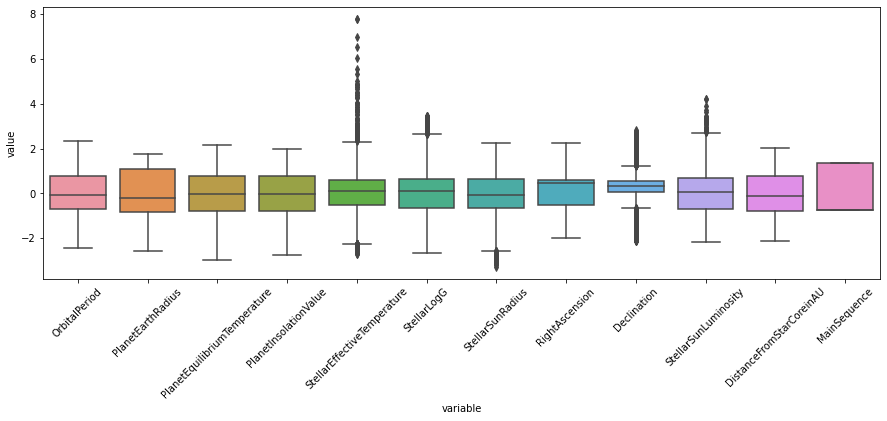

In [92]:
from sklearn.preprocessing import PowerTransformer

vis = df.copy()
ss = PowerTransformer()
for ncol in NUMERICAL_COLS:
    vis[ncol] = ss.fit_transform(vis[ncol].values.reshape(-1, 1))

plt.figure(figsize=(15,5))
sns.boxplot(x='variable', y='value', data=pd.melt(vis[NUMERICAL_COLS]))
plt.xticks(rotation=45)
plt.show()

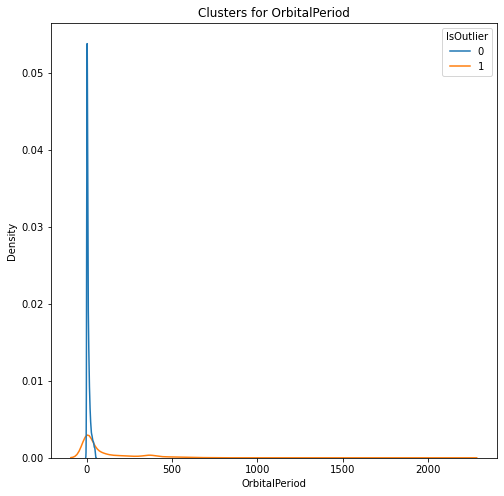

Ttest_indResult(statistic=-49.97347114312354, pvalue=0.0)


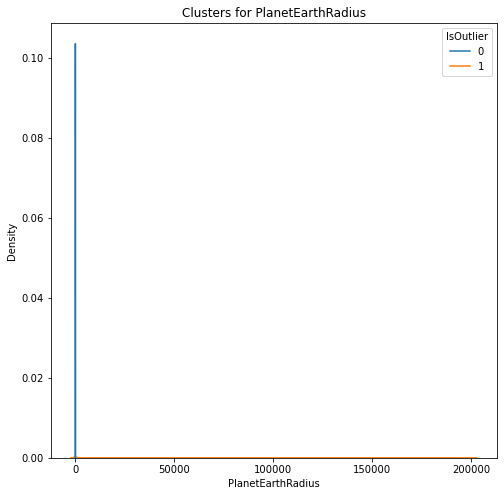

Ttest_indResult(statistic=-3.8192327258071663, pvalue=0.00013449718531035037)


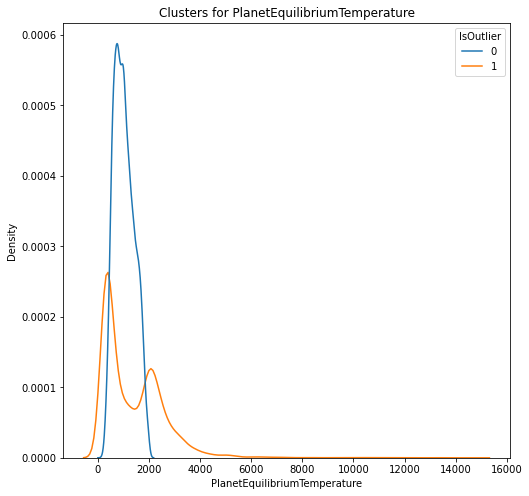

Ttest_indResult(statistic=-23.81136685956308, pvalue=1.1360498846990319e-122)


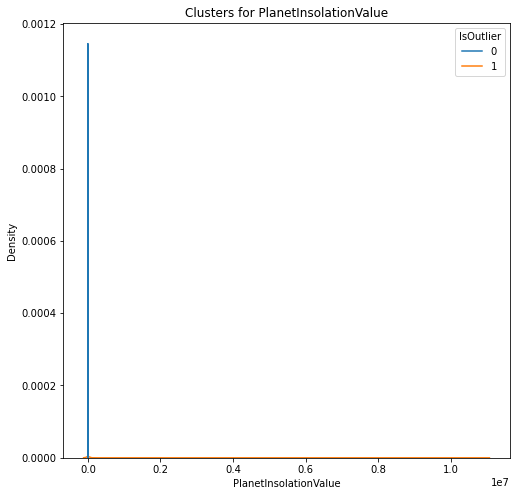

Ttest_indResult(statistic=-6.014247491676829, pvalue=1.8563474294589654e-09)


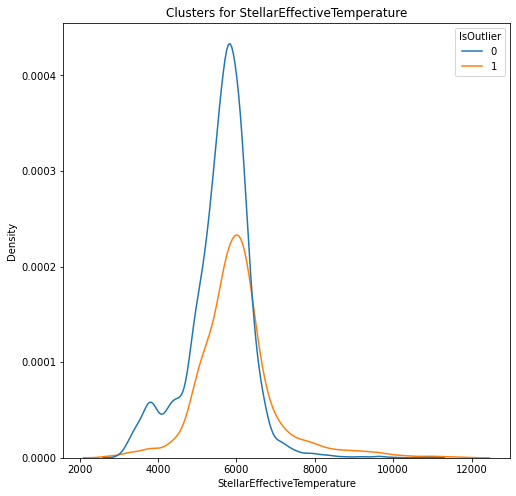

Ttest_indResult(statistic=-27.890780448963024, pvalue=2.9407152813914634e-166)


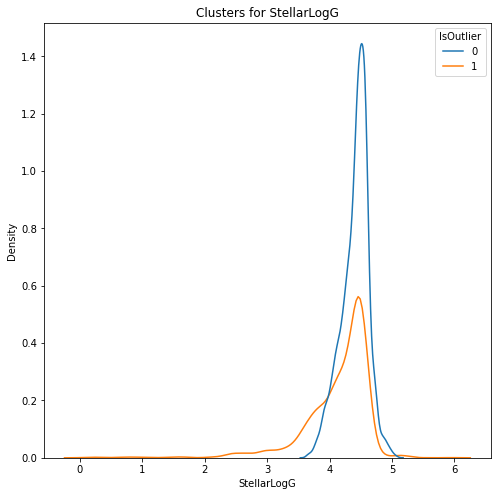

Ttest_indResult(statistic=39.302557326026275, pvalue=0.0)


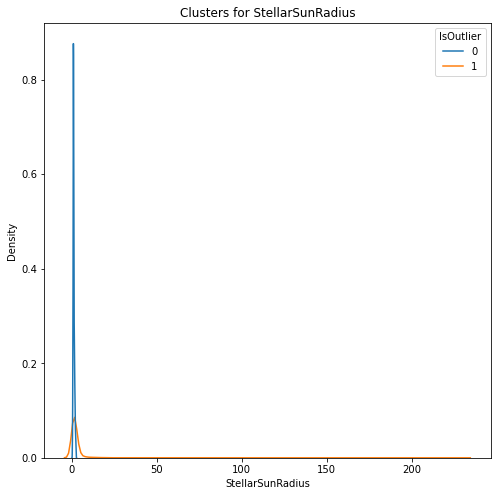

Ttest_indResult(statistic=-15.462096981496899, pvalue=1.8938015098369141e-53)


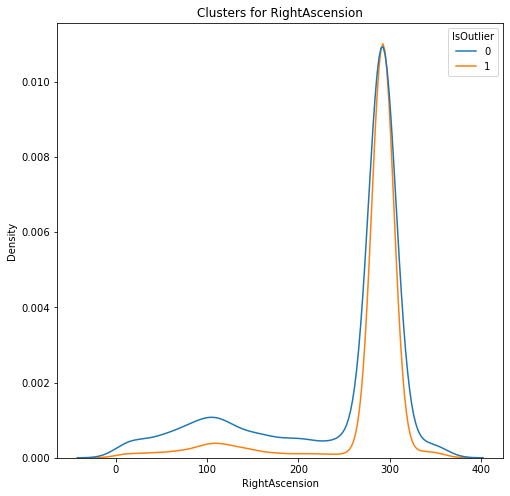

Ttest_indResult(statistic=-19.180222615803274, pvalue=7.283723475272324e-81)


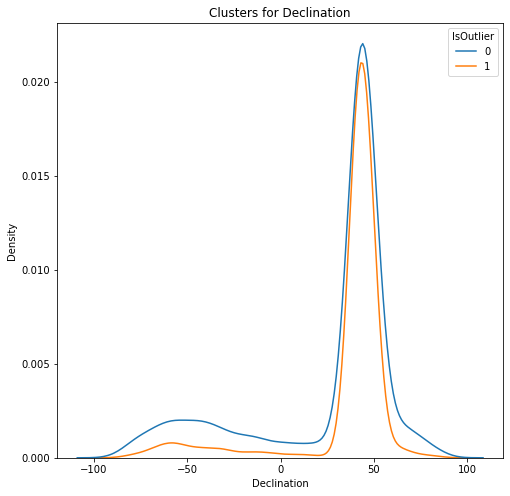

Ttest_indResult(statistic=-14.505354470681821, pvalue=2.649422540830231e-47)


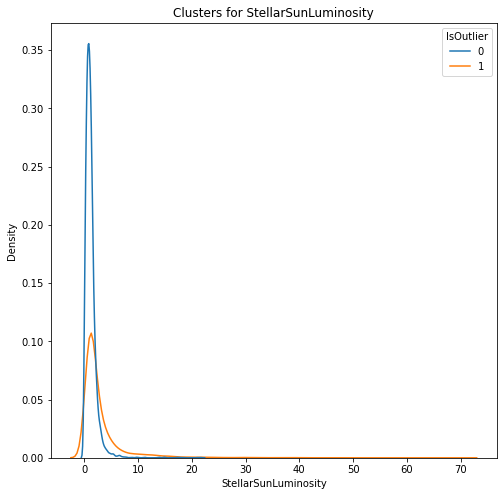

Ttest_indResult(statistic=-32.516945222517286, pvalue=5.856508688448186e-223)


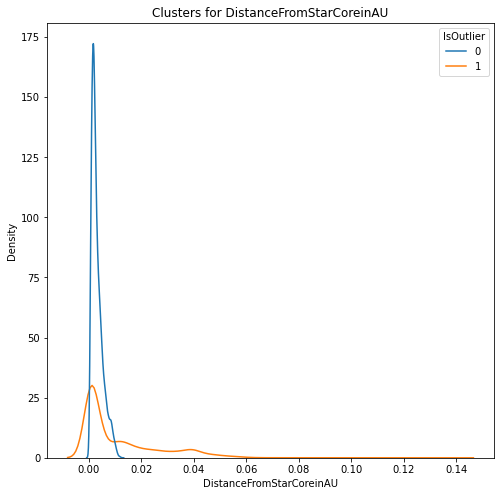

Ttest_indResult(statistic=-48.83185693195646, pvalue=0.0)


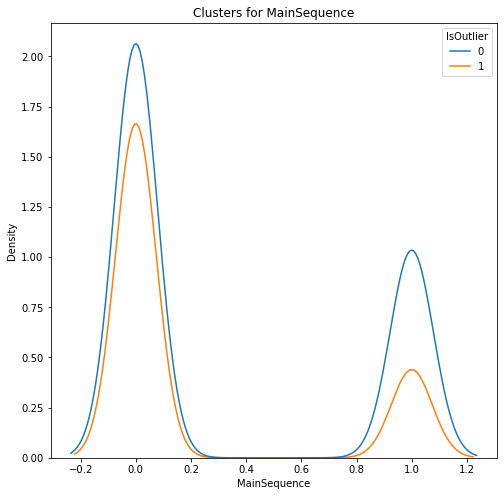

Ttest_indResult(statistic=15.461988281539936, pvalue=1.8969418643376566e-53)


In [130]:
from scipy.stats import ttest_ind
import matplotlib.pyplot as plt
import seaborn as sns

for ncol in NUMERICAL_COLS: 
    plt.figure(figsize=(8,8))
    sns.kdeplot(merged_df[ncol], hue=merged_df['IsOutlier'])
    plt.title(f"Clusters for {ncol}")
    plt.show()

    print(ttest_ind(merged_df[merged_df['IsOutlier']==0][ncol], merged_df[merged_df['IsOutlier']==1][ncol]))

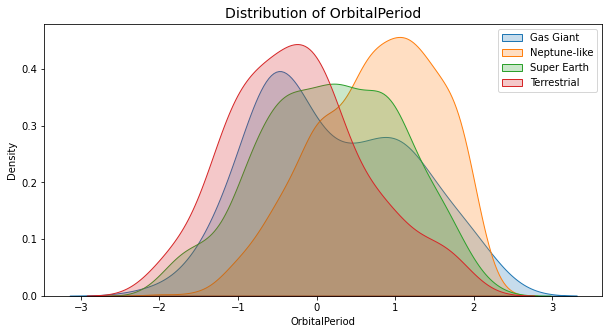

The P-Value between Gas Giant and Neptune-like is: 1.5166642555032986e-10 (Significant?: True)
The P-Value between Gas Giant and Super Earth is: 0.9485626971053569 (Significant?: False)
The P-Value between Gas Giant and Terrestrial is: 0.0004365103181221454 (Significant?: True)
The P-Value between Neptune-like and Super Earth is: 9.62551508766912e-43 (Significant?: True)
The P-Value between Neptune-like and Terrestrial is: 2.1815951582421874e-37 (Significant?: True)
The P-Value between Super Earth and Terrestrial is: 3.4156420628626517e-07 (Significant?: True)
Number of Significant Values: 5


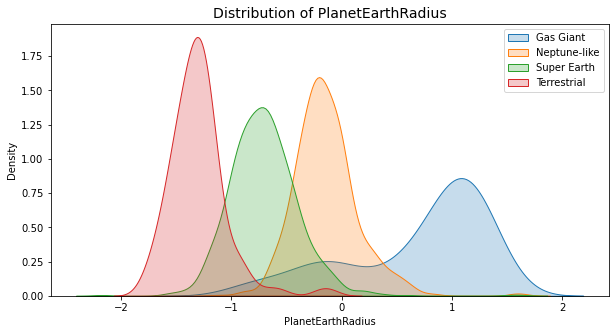

The P-Value between Gas Giant and Neptune-like is: 5.576510836150887e-90 (Significant?: True)
The P-Value between Gas Giant and Super Earth is: 4.92892480089116e-199 (Significant?: True)
The P-Value between Gas Giant and Terrestrial is: 3.6400483324838933e-90 (Significant?: True)
The P-Value between Neptune-like and Super Earth is: 2.275772924210267e-243 (Significant?: True)
The P-Value between Neptune-like and Terrestrial is: 4.0074180768369567e-227 (Significant?: True)
The P-Value between Super Earth and Terrestrial is: 1.9035269742551872e-85 (Significant?: True)
Number of Significant Values: 6


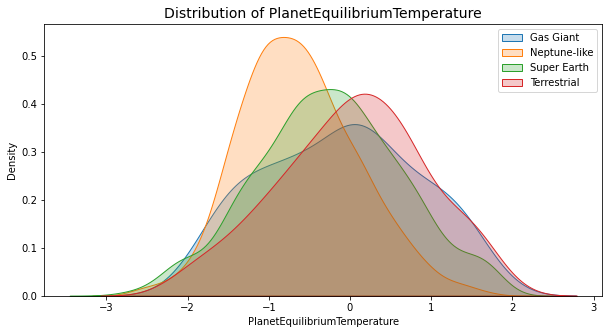

The P-Value between Gas Giant and Neptune-like is: 6.641186960731222e-10 (Significant?: True)
The P-Value between Gas Giant and Super Earth is: 0.1428616064224531 (Significant?: False)
The P-Value between Gas Giant and Terrestrial is: 0.23299740747629508 (Significant?: False)
The P-Value between Neptune-like and Super Earth is: 3.064515568192741e-20 (Significant?: True)
The P-Value between Neptune-like and Terrestrial is: 8.990032654224149e-20 (Significant?: True)
The P-Value between Super Earth and Terrestrial is: 0.0004951669357766153 (Significant?: True)
Number of Significant Values: 4


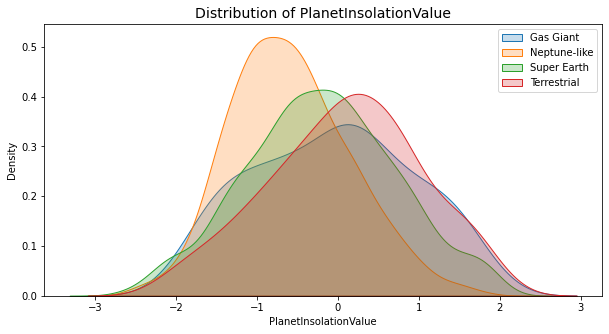

The P-Value between Gas Giant and Neptune-like is: 5.938192746337233e-10 (Significant?: True)
The P-Value between Gas Giant and Super Earth is: 0.14546100837589301 (Significant?: False)
The P-Value between Gas Giant and Terrestrial is: 0.23115985123913899 (Significant?: False)
The P-Value between Neptune-like and Super Earth is: 1.5952991509938808e-20 (Significant?: True)
The P-Value between Neptune-like and Terrestrial is: 6.622307347561745e-20 (Significant?: True)
The P-Value between Super Earth and Terrestrial is: 0.000491116799957823 (Significant?: True)
Number of Significant Values: 4


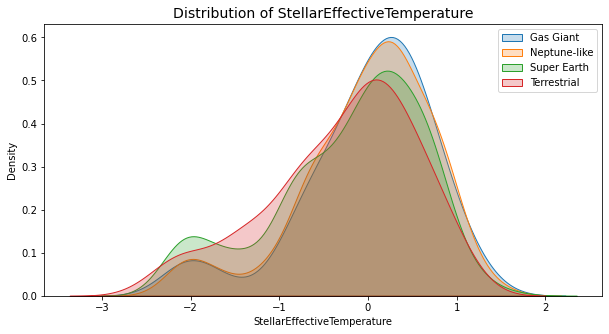

The P-Value between Gas Giant and Neptune-like is: 0.886773199994466 (Significant?: False)
The P-Value between Gas Giant and Super Earth is: 0.017633178413367045 (Significant?: True)
The P-Value between Gas Giant and Terrestrial is: 0.007001815964879273 (Significant?: True)
The P-Value between Neptune-like and Super Earth is: 1.6812237498365193e-07 (Significant?: True)
The P-Value between Neptune-like and Terrestrial is: 0.00012548604400875986 (Significant?: True)
The P-Value between Super Earth and Terrestrial is: 0.35103584415608635 (Significant?: False)
Number of Significant Values: 4


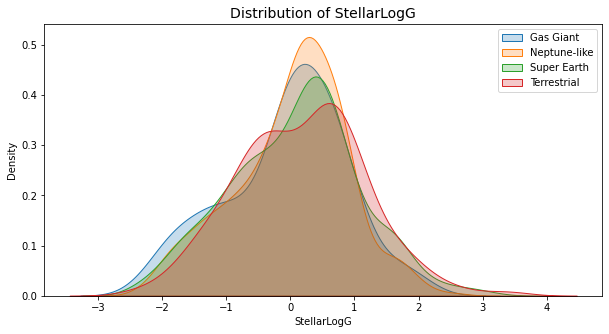

The P-Value between Gas Giant and Neptune-like is: 0.41495237030958665 (Significant?: False)
The P-Value between Gas Giant and Super Earth is: 0.21006792821682155 (Significant?: False)
The P-Value between Gas Giant and Terrestrial is: 0.07562006836894457 (Significant?: False)
The P-Value between Neptune-like and Super Earth is: 0.21809271416525616 (Significant?: False)
The P-Value between Neptune-like and Terrestrial is: 0.07150388337728521 (Significant?: False)
The P-Value between Super Earth and Terrestrial is: 0.3023393086015693 (Significant?: False)
Number of Significant Values: 0


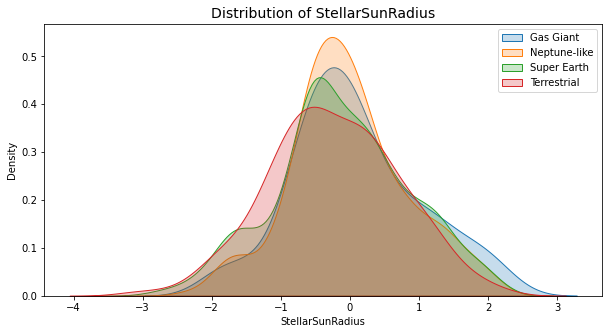

The P-Value between Gas Giant and Neptune-like is: 0.31170780417733823 (Significant?: False)
The P-Value between Gas Giant and Super Earth is: 0.06838291344330333 (Significant?: False)
The P-Value between Gas Giant and Terrestrial is: 0.012582198268834409 (Significant?: True)
The P-Value between Neptune-like and Super Earth is: 0.03166968982695269 (Significant?: True)
The P-Value between Neptune-like and Terrestrial is: 0.006981299133308965 (Significant?: True)
The P-Value between Super Earth and Terrestrial is: 0.1612210443046319 (Significant?: False)
Number of Significant Values: 3


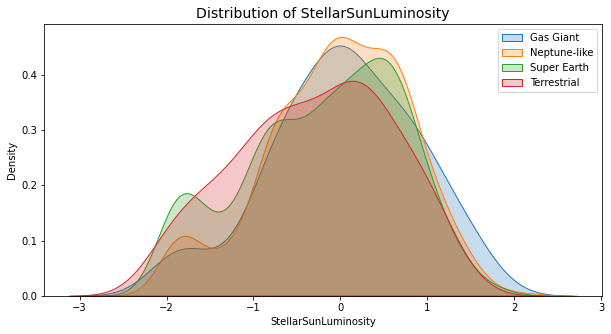

The P-Value between Gas Giant and Neptune-like is: 0.5413421776267098 (Significant?: False)
The P-Value between Gas Giant and Super Earth is: 0.023910852132072734 (Significant?: True)
The P-Value between Gas Giant and Terrestrial is: 0.00609641417023384 (Significant?: True)
The P-Value between Neptune-like and Super Earth is: 7.36947831103742e-05 (Significant?: True)
The P-Value between Neptune-like and Terrestrial is: 0.0005439844954177835 (Significant?: True)
The P-Value between Super Earth and Terrestrial is: 0.2128163979414967 (Significant?: False)
Number of Significant Values: 4


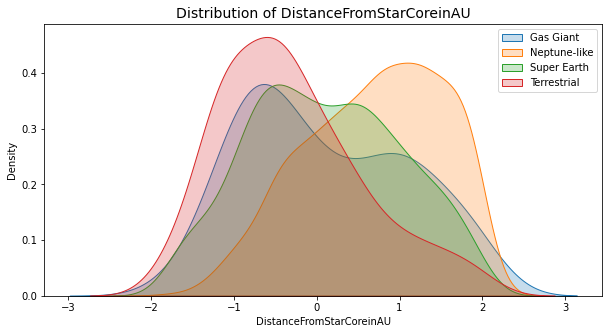

The P-Value between Gas Giant and Neptune-like is: 9.370103329355886e-11 (Significant?: True)
The P-Value between Gas Giant and Super Earth is: 0.9688292374446936 (Significant?: False)
The P-Value between Gas Giant and Terrestrial is: 0.0007113363397136988 (Significant?: True)
The P-Value between Neptune-like and Super Earth is: 7.54063079413937e-44 (Significant?: True)
The P-Value between Neptune-like and Terrestrial is: 3.264123518416397e-36 (Significant?: True)
The P-Value between Super Earth and Terrestrial is: 4.588730072838399e-07 (Significant?: True)
Number of Significant Values: 5


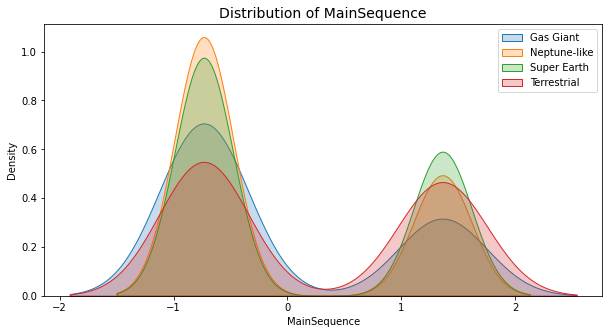

The P-Value between Gas Giant and Neptune-like is: 0.8634048988824158 (Significant?: False)
The P-Value between Gas Giant and Super Earth is: 0.18689916137834492 (Significant?: False)
The P-Value between Gas Giant and Terrestrial is: 0.021208310173757898 (Significant?: True)
The P-Value between Neptune-like and Super Earth is: 0.008737008188015392 (Significant?: True)
The P-Value between Neptune-like and Terrestrial is: 0.001302786027998149 (Significant?: True)
The P-Value between Super Earth and Terrestrial is: 0.06566681050912904 (Significant?: False)
Number of Significant Values: 3


,NumSignificantHT
PlanetEarthRadius,6
OrbitalPeriod,5
DistanceFromStarCoreinAU,5
PlanetEquilibriumTemperature,4
PlanetInsolationValue,4
StellarEffectiveTemperature,4
StellarSunLuminosity,4
StellarSunRadius,3
MainSequence,3
StellarLogG,0


In [98]:
from scipy.stats import ttest_ind

planets = vis[vis['Disposition']=='CFRM'].drop(columns=['RightAscension', 'Declination'])

def calculate_pval(df1, df2, col, l1, l2):
    pval = ttest_ind(df1[col], df2[col]).pvalue
    significant = pval <= 0.05
    print(f'The P-Value between {l1} and {l2} is: {pval} (Significant?: {significant})')
    if significant:
        return 1
    else:
        return 0

planets_sig = pd.DataFrame()

for ncol in NUMERICAL_COLS:
    if ncol in ['RightAscension', 'Declination']:
        continue
    plot(planets, ncol, 'cdist', title=f'Distribution of {ncol}', cat_col='PlanetType', shade=True, cat_filters=['TBD', 'Unknown', 'N/A'])
    planet_types = df['PlanetType'].unique()
    n_sig = 0
    for p1 in range(len(planet_types)):
        for p2 in range(p1+1, len(planet_types)):
            if planet_types[p1] in ['TBD', 'Unknown', 'N/A'] or planet_types[p2] in ['TBD', 'Unknown', 'N/A']:
                continue
            else:
                n_sig += calculate_pval(planets[planets['PlanetType']==planet_types[p1]], planets[planets['PlanetType']==planet_types[p2]], ncol, planet_types[p1], planet_types[p2])
    planets_sig[ncol] = [n_sig]
    print(f'Number of Significant Values: {n_sig}')

planets_sig = planets_sig.T.sort_values(by=0, ascending=False)

planets_sig.columns = ['NumSignificantHT']

planets_sig

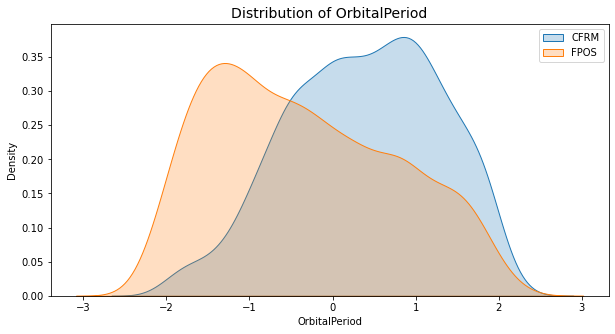

The P-Value between CFRM and FPOS is: 9.203822462643026e-104 (Significant?: True)
Number of Significant Values: 1


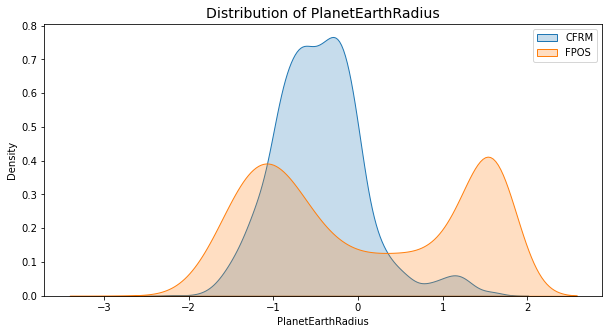

The P-Value between CFRM and FPOS is: 1.4837687587280983e-63 (Significant?: True)
Number of Significant Values: 1


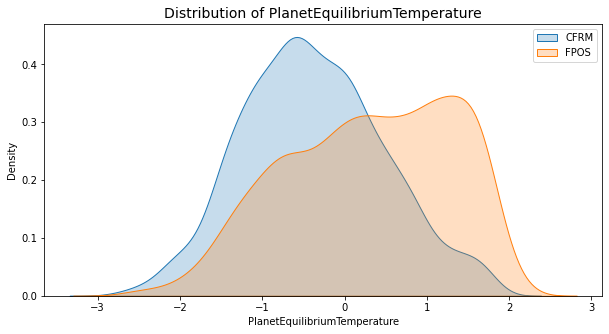

The P-Value between CFRM and FPOS is: 2.8056241111865195e-106 (Significant?: True)
Number of Significant Values: 1


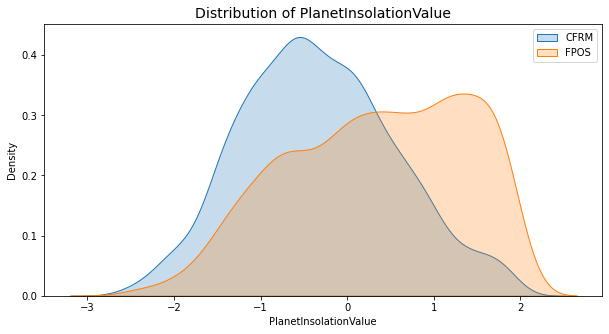

The P-Value between CFRM and FPOS is: 1.0876840910521986e-100 (Significant?: True)
Number of Significant Values: 1


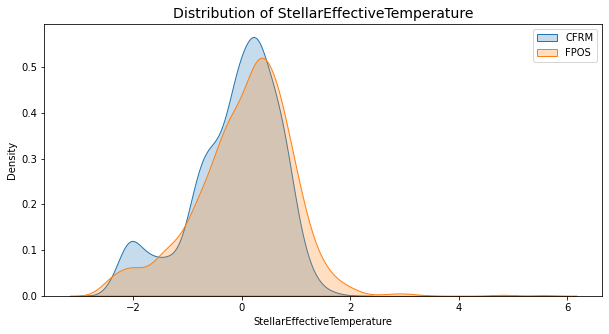

The P-Value between CFRM and FPOS is: 6.318517187449373e-10 (Significant?: True)
Number of Significant Values: 1


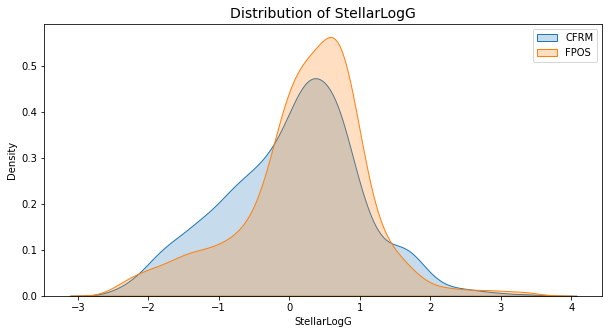

The P-Value between CFRM and FPOS is: 2.562140633453863e-08 (Significant?: True)
Number of Significant Values: 1


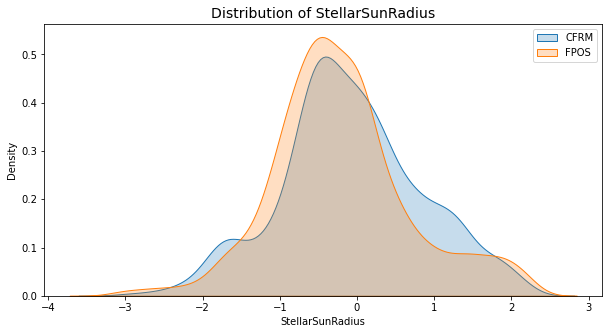

The P-Value between CFRM and FPOS is: 6.7179473895496705e-06 (Significant?: True)
Number of Significant Values: 1


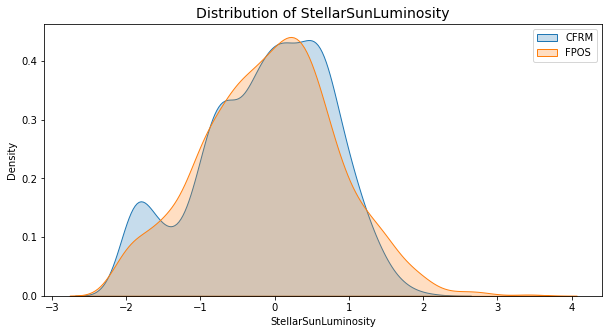

The P-Value between CFRM and FPOS is: 0.06961397592726644 (Significant?: False)
Number of Significant Values: 0


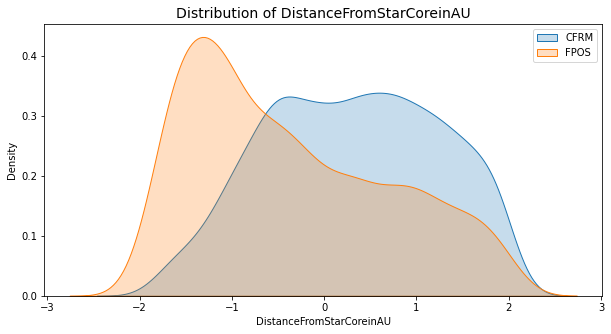

The P-Value between CFRM and FPOS is: 7.520502205070982e-92 (Significant?: True)
Number of Significant Values: 1


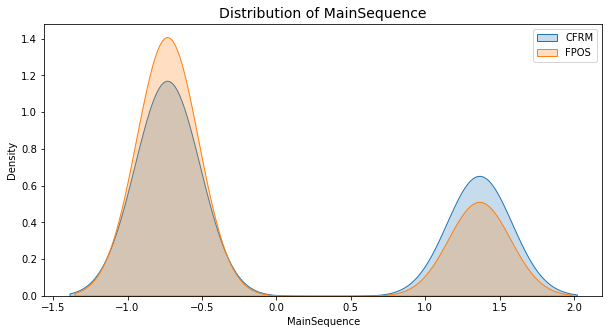

The P-Value between CFRM and FPOS is: 1.0257357781783105e-09 (Significant?: True)
Number of Significant Values: 1


,NumSignificantHT
OrbitalPeriod,1
PlanetEarthRadius,1
PlanetEquilibriumTemperature,1
PlanetInsolationValue,1
StellarEffectiveTemperature,1
StellarLogG,1
StellarSunRadius,1
DistanceFromStarCoreinAU,1
MainSequence,1
StellarSunLuminosity,0


In [132]:
disp_df = pd.DataFrame()

for ncol in NUMERICAL_COLS:
    if ncol in ['RightAscension', 'Declination']:
        continue
    plot(vis, ncol, 'cdist', title=f'Distribution of {ncol}', cat_col='Disposition', shade=True, drop_empty=False, cat_filters=['CAND'])
    dispositions = df['Disposition'].unique()
    n_sig = 0
    for p1 in range(len(dispositions)):
        if dispositions[p1] == 'CAND':
            continue
        for p2 in range(p1+1, len(dispositions)):
            if dispositions[p2] == 'CAND':
                continue
            n_sig += calculate_pval(vis[vis['Disposition']==dispositions[p1]], vis[vis['Disposition']==dispositions[p2]], ncol, dispositions[p1], dispositions[p2])
    disp_df[ncol] = [n_sig]
    print(f'Number of Significant Values: {n_sig}')

disp_df = disp_df.T.sort_values(by=0, ascending=False)
disp_df.columns = ['NumSignificantHT']
disp_df

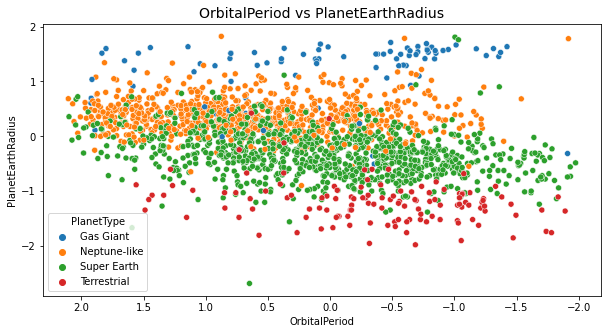

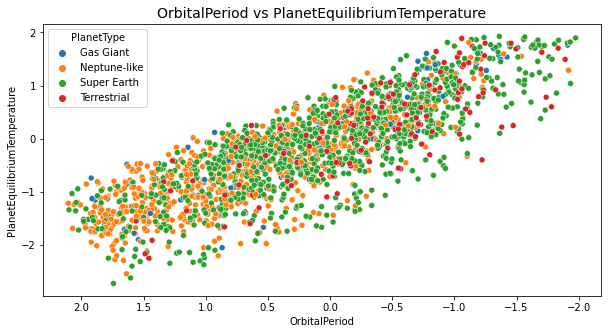

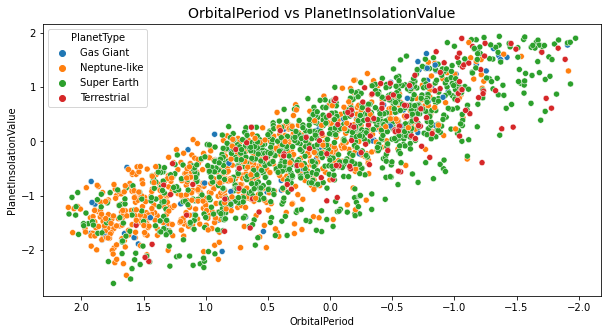

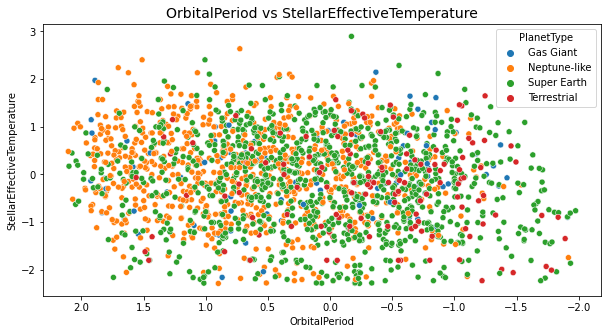

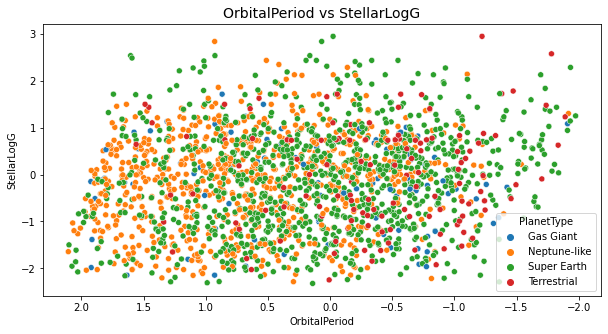

...

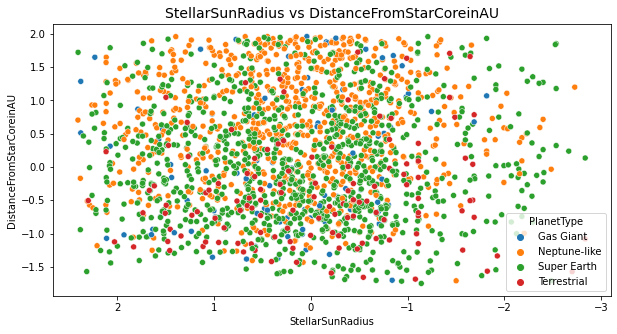

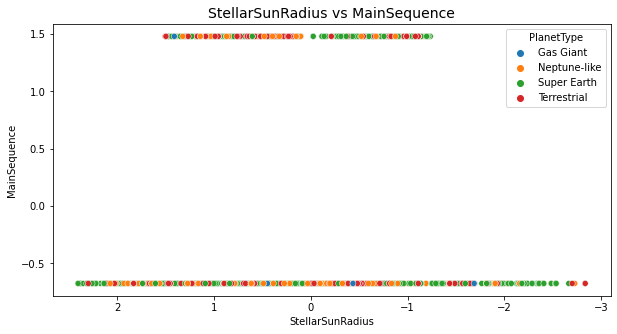

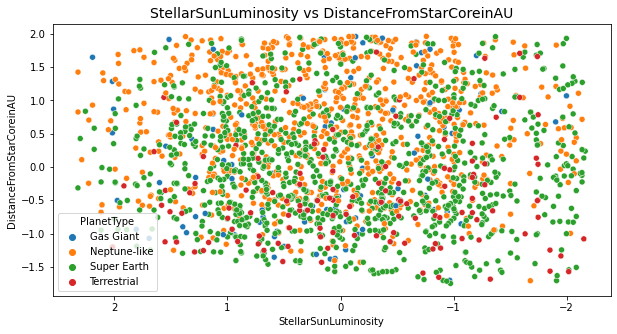

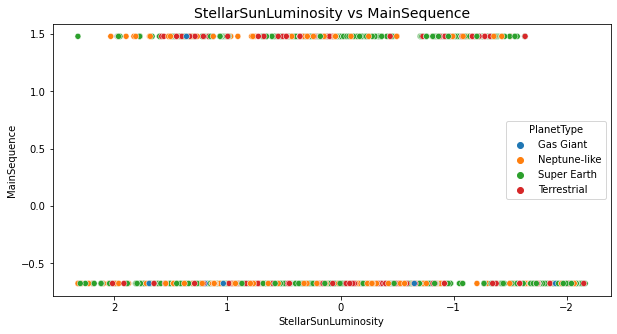

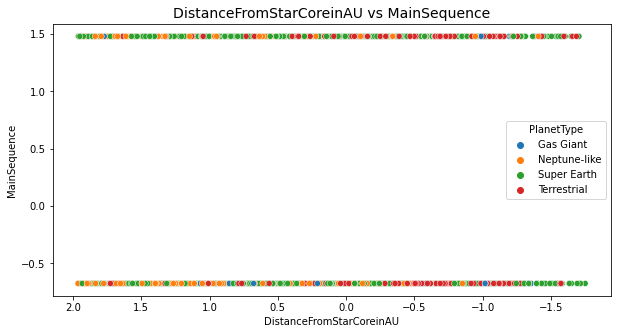

In [46]:
for xcol in range(len(NUMERICAL_COLS)):
    for ycol in range(xcol+1, len(NUMERICAL_COLS)):
        if not (NUMERICAL_COLS[xcol]=='Declination' or NUMERICAL_COLS[ycol] =='Declination' or NUMERICAL_COLS[xcol]=='RightAscension' or NUMERICAL_COLS[ycol]=='RightAscension'):
            plot(vis, NUMERICAL_COLS[xcol], 'cscatt', title=f'{NUMERICAL_COLS[xcol]} vs {NUMERICAL_COLS[ycol]}', col2=NUMERICAL_COLS[ycol], cat_col='PlanetType', cat_filters=['TBD', 'Unknown', 'N/A'], invert_x=True)


Note for Stellar Properties.

In the diagram we see a very very interesting shape. Upon further research, these diagrams are determined to follow the Hertzsprung-Russell Diagram which allows us to classify stars into different stages of the their life. Those that follow a certain curve exists as the Main Sequence Stars where in Nuclear Fusion exists. Very Hot Stars that don't shine as bright are found at the bottom

# Correlations

In [135]:
classif_map = {
    'M': 0, 'K': 1, 'G': 2, 'F': 3, 'A': 4, 'B': 5, 'O': 6
}

from sklearn.preprocessing import LabelEncoder

# Cleaning for Correlations
correl_df = vis.copy()
correl_df.drop(columns=['ObjectOfInterest', 'PlanetName'], inplace=True)

correl_df = correl_df[correl_df['Disposition']=='CFRM']

correl_df.drop(columns=['Disposition'], inplace=True)

print(correl_df['PlanetType'].unique())

le = LabelEncoder()
correl_df['PlanetType'] = le.fit_transform(correl_df['PlanetType'].values.reshape(-1, 1))
correl_df['StarClassification'] = correl_df['StarClassification'].map(classif_map)

correl_df.drop(columns=['RightAscension', 'Declination'], inplace=True)

correl_df.reset_index(drop=True, inplace=True)

correl_df

['Gas Giant' 'Neptune-like' 'Super Earth' 'Unknown' 'Terrestrial']


C:\Users\paolo\anaconda3\envs\py39\lib\site-packages\sklearn\preprocessing\_label.py:115: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


,OrbitalPeriod,PlanetEarthRadius,PlanetEquilibriumTemperature,PlanetInsolationValue,StellarEffectiveTemperature,StellarLogG,StellarSunRadius,PlanetType,StellarSunLuminosity,DistanceFromStarCoreinAU,StarClassification,MainSequence
0,-0.574122,1.305934,1.308050,1.416889,0.916104,-1.321853,1.288960,0,1.238186,-0.897127,3,-0.733788
1,0.826081,0.807488,-0.691779,-0.657563,0.278536,0.365298,-0.215926,0,0.053846,0.863245,2,-0.733788
2,-0.468069,0.800741,0.061805,0.127186,-0.053782,0.840998,-0.723846,0,-0.414254,-0.476421,2,-0.733788
3,-1.324068,1.023747,1.431131,1.542928,-0.078321,-0.604770,0.369439,0,0.060426,-1.416733,2,1.362791
4,-0.573193,1.150483,-0.021468,0.037468,-0.588219,0.725538,-0.654248,0,-0.752636,-0.596414,1,1.362791
...,...,...,...,...,...,...,...,...,...,...,...,...
2056,0.241569,-0.667469,0.421756,0.500721,0.526344,-1.321853,1.403427,2,1.008600,-0.111948,2,-0.733788
2057,1.062632,-0.719696,0.083759,0.147755,0.960828,-1.959006,1.865975,2,1.542328,0.617545,3,-0.733788
2058,0.452055,-1.112438,-0.575707,-0.537087,0.250046,0.829390,-0.746028,1,-0.220060,0.504378,2,-0.733788
2059,1.598002,-0.464242,-0.983235,-0.961416,0.294249,-0.609688,0.520214,2,0.415489,1.520533,2,-0.733788


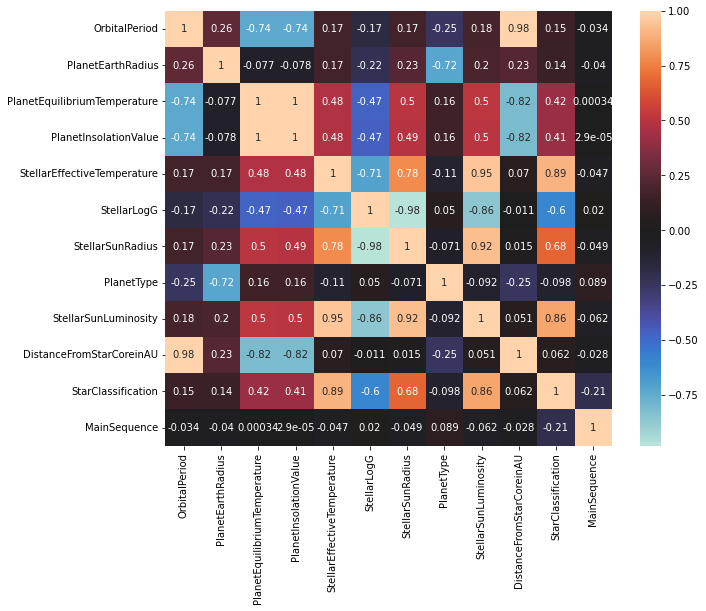

In [136]:
correl = correl_df.corr()

# mask = np.triu(correl)

plt.figure(figsize=(10,8))
sns.heatmap(correl, center=0.0, annot=True)
plt.show()

# TSNE

In [49]:
# from sklearn.manifold import TSNE
# from sklearn.decomposition import PCA
# from sklearn.decomposition import KernelPCA

# tsne_df = TSNE().fit_transform(correl_df.drop(columns=['PlanetType']))
# pca = PCA(n_components=2)
# pca_df = pca.fit_transform(correl_df.drop(columns=['PlanetType']))

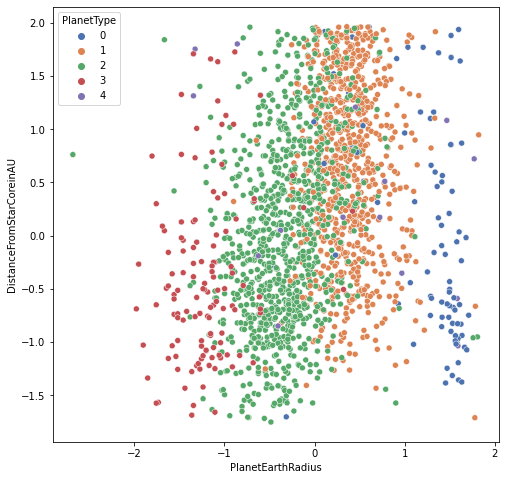

In [50]:
# tsne_df = pd.DataFrame(tsne_df, columns=['x', 'y'])

# tsne_df['PlanetType'] = correl_df['PlanetType']

plt.figure(figsize=(8,8))
sns.scatterplot(x='PlanetEarthRadius', y='DistanceFromStarCoreinAU', hue='PlanetType', data=correl_df, legend=True, palette='deep')
plt.show()

# Clustering

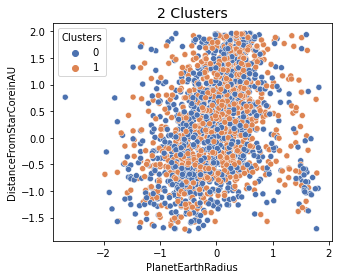

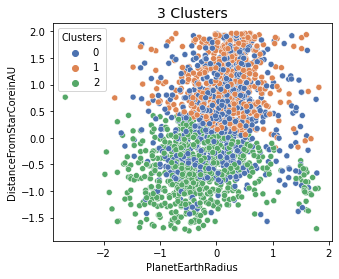

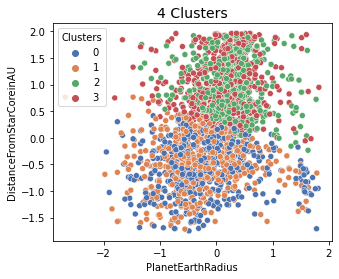

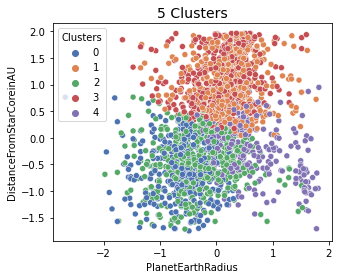

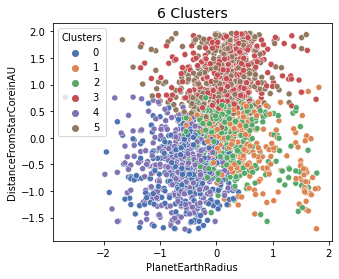

...

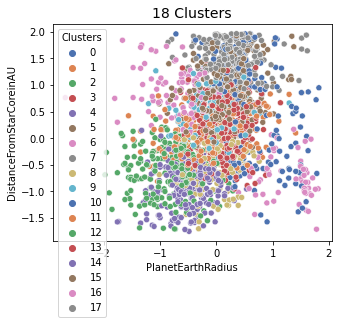

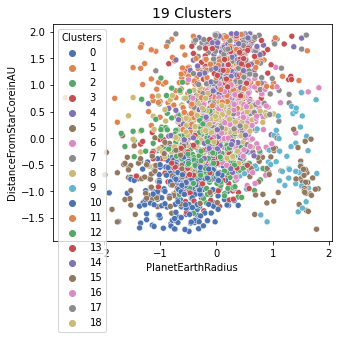

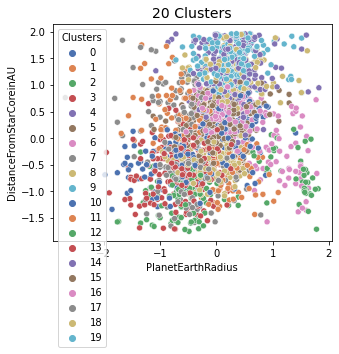

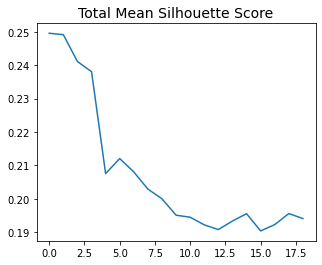

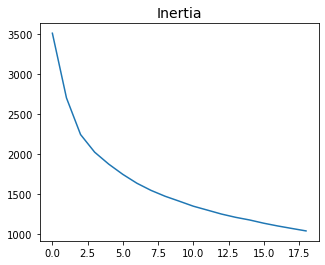

In [51]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

clust_df = correl_df.drop(columns=['PlanetType'])

n = 20

ss_df = []
inert = []
for i in range(2, n+1):
    km = KMeans(n_clusters=i)
    pred = km.fit_predict(clust_df)
    ss = silhouette_score(clust_df, pred)
    ss_df.append(ss)

    inert.append(km.inertia_)
    
    temp_clust = correl_df.copy()
    temp_clust['Clusters'] = pred

    plt.figure(figsize=(5,4))
    sns.scatterplot(x='PlanetEarthRadius', y='DistanceFromStarCoreinAU', hue='Clusters', data=temp_clust, legend=True, palette='deep')
    plt.title(f'{i} Clusters', fontsize=14)
    plt.show()
    

plt.figure(figsize=(5,4))
plt.plot(ss_df)
plt.title('Total Mean Silhouette Score', fontsize=14)
plt.show() 

plt.figure(figsize=(5,4))
plt.plot(inert)
plt.title('Inertia', fontsize=14)
plt.show() 

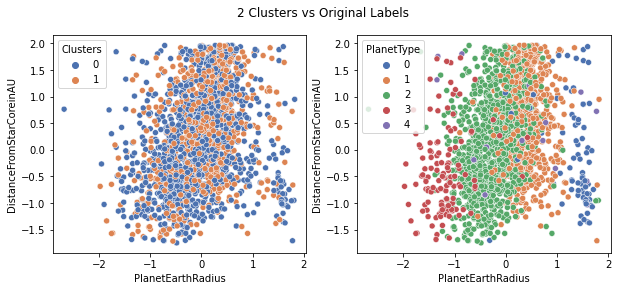

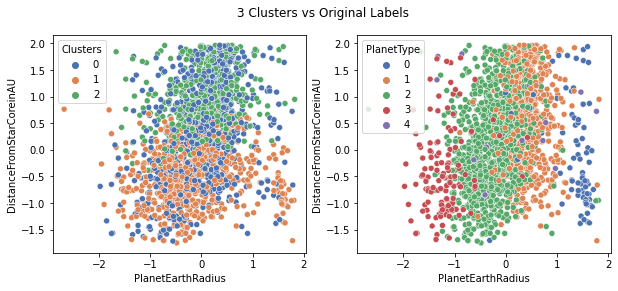

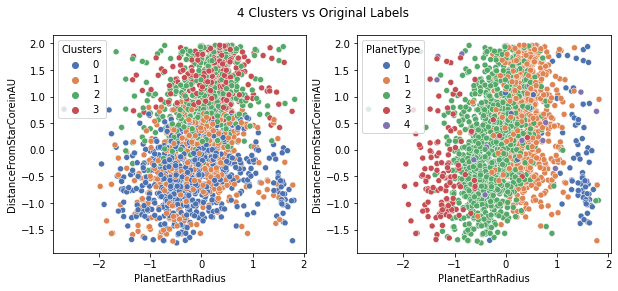

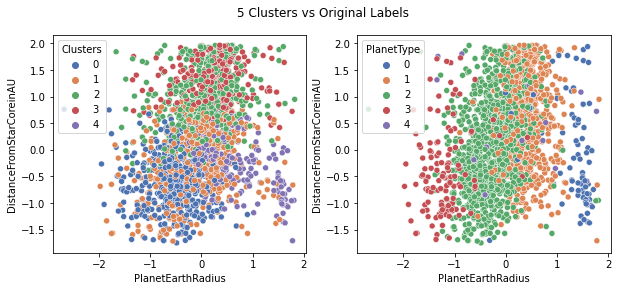

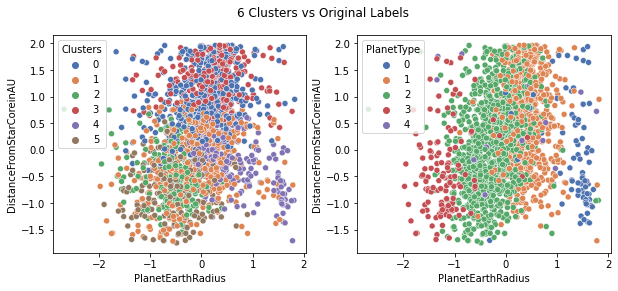

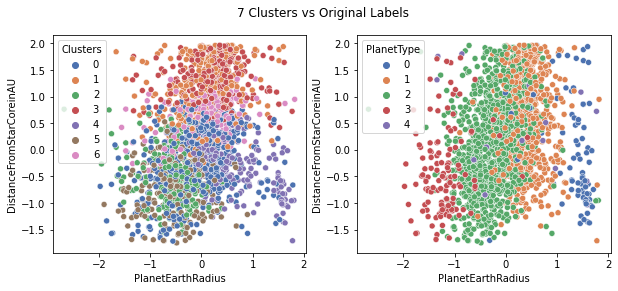

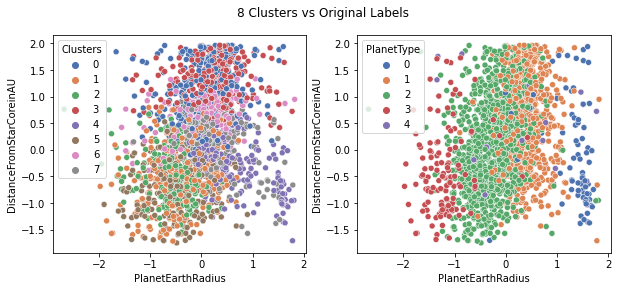

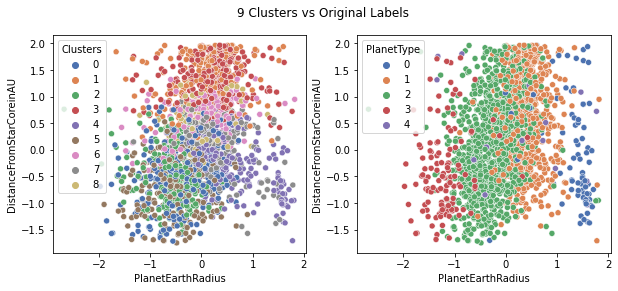

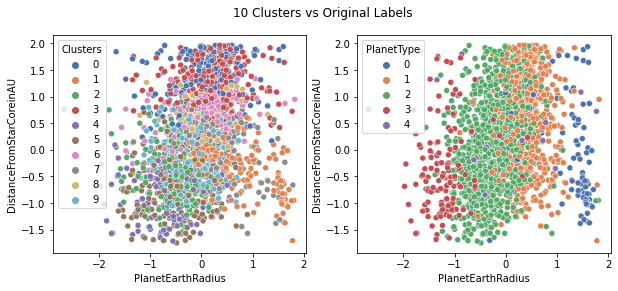

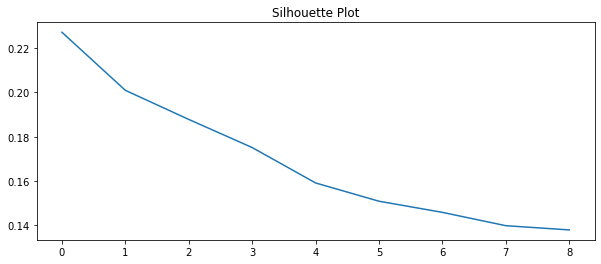

In [52]:
from sklearn.cluster import MeanShift
from sklearn.cluster import AgglomerativeClustering

n = 10
ss_list = []
for i in range(2, n+1):
    ms = AgglomerativeClustering(n_clusters=i)
    pred = ms.fit_predict(clust_df)
    ss = silhouette_score(clust_df, pred)

    temp_clust = correl_df.copy()
    temp_clust['Clusters'] = pred
    temp_clust['PlanetType'] = correl_df['PlanetType']

    fig, ax = plt.subplots(1, 2, figsize=(10, 4))
    sns.scatterplot(x='PlanetEarthRadius', y='DistanceFromStarCoreinAU', hue='PlanetType', data=temp_clust, legend=True, palette='deep', ax=ax[1])
    sns.scatterplot(x='PlanetEarthRadius', y='DistanceFromStarCoreinAU', hue='Clusters', data=temp_clust, legend=True, palette='deep', ax=ax[0])
    plt.suptitle(f'{i} Clusters vs Original Labels')
    plt.show()

    ss_list.append(ss)

plt.figure(figsize=(10, 4))
plt.plot(ss_list)
plt.title('Silhouette Plot')
plt.show()

The Best Number of Clusters is 4

# Characteristics of each Cluster According to Agglomerative Clustering

In [53]:
import numpy as np
import matplotlib.pyplot as plt
import re

PLANETARY_COLUMNS = [x for x in clust_df.columns if re.match('(Planet|Orbit)', x)]
STELLAR_COLUMNS = [x for x in clust_df.columns if re.match('.*Stellar.*', x)]

def make_cluster_analysis(df_clus, cluster_col=None, kind_cols=None, n_clust=4, clust_kind='agglo', drop_out=True):
    df_clust = df_clus.copy()
    
    if drop_out:
        for col in df_clust.columns:
            if col != cluster_col:
                df_clust[col] = df_clust[(df_clust[col] >= -3) & (df_clust[col] <= 3)][col]

    if kind_cols == 'planet':
        df_clust = df_clust[PLANETARY_COLUMNS]
    elif kind_cols == 'star':
        df_clust = df_clust[STELLAR_COLUMNS]

    if not cluster_col:
        if clust_kind == 'agglo':
            best = AgglomerativeClustering(n_clusters=n_clust)
        else:
            best = KMeans(n_clusters=n_clust)
        pred = best.fit_predict(clust_df)
        df_clust['Cluster'] = pred

        cluster_col = 'Cluster'

    for col in range(0, len(df_clust.columns), 2):
        fig, ax = plt.subplots(1, 2, figsize=(13,5))

        if df_clust.columns[col] != cluster_col:
            sns.boxplot(x=cluster_col, y=df_clust.columns[col], data=df_clust, ax=ax[0])
            ax[0].set_title(f'{df_clust.columns[col]} according to Clusters')

        if df_clust.columns[col+1] != cluster_col:
            sns.boxplot(x=cluster_col, y=df_clust.columns[col+1], data=df_clust, ax=ax[1])
            ax[1].set_title(f'{df_clust.columns[col+1]} according to Clusters')
        
        plt.show()

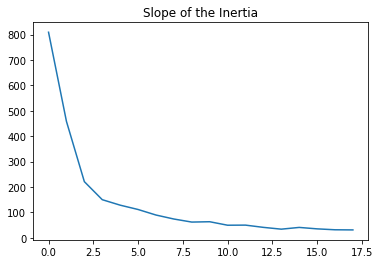

In [54]:
diff = [inert[0]-inert[1]]
for i in range(1, len(inert)-1):
    diff.append(inert[i] - inert[i+1])

plt.figure()
plt.plot(diff)
plt.title('Slope of the Inertia')
plt.show()

# Interpretation

Getting the Slope of the Inertia, we get the point at which the graph of the intertia starts becoming linear and thus isn't important anymore. In this graph, we pick the value right before it becomes stagnant. In this graph, it is shown to be 7. Thus, the best amount of clusters would be 7 based on inertia. 

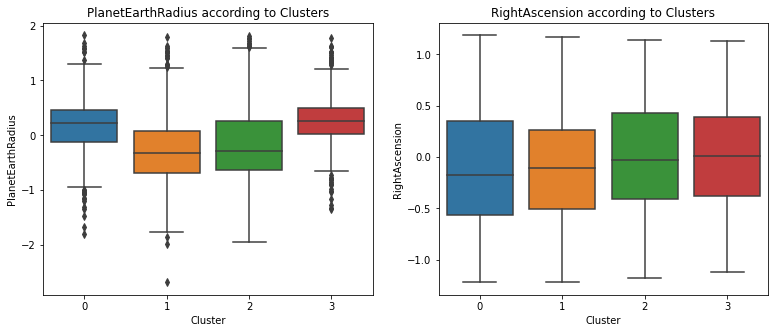

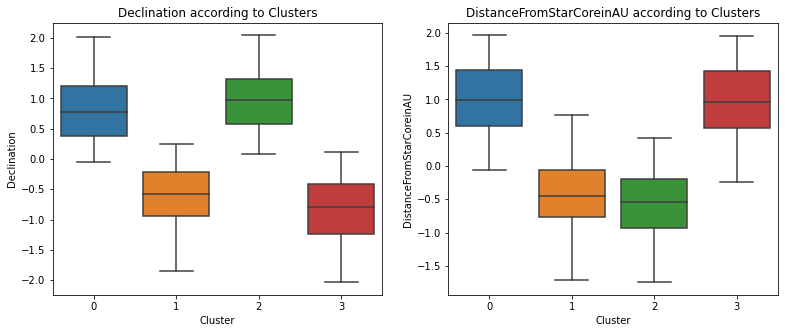

IndexError: index 5 is out of bounds for axis 0 with size 5

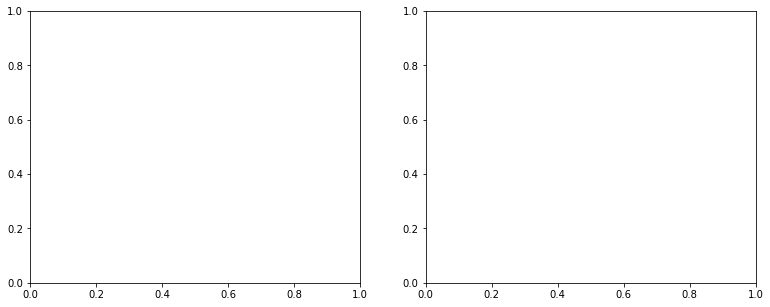

In [55]:
make_cluster_analysis(correl_df.drop(columns=['PlanetType']), n_clust=4, clust_kind='kmeans')

## Interpretation

This new Clusters provide us a new idea of what the planets could be. Below are the Summary of the Characteristics:

Cluster 0: (Planet with a Red Dwarf)
- Average Orbital Period
- Average Radius
- Cold
- Low Insolation Value
- Warm Star
- Strong gravity
- Small Star

Cluster 1: (Mercury-like)
- Short Orbital Period
- Small Planet
- Very Hot
- High Insolation Flux
- Quite Average Star Temp (slightly Colder)
- A bit stronger surface gravity
- Quite Average Star Radius

Cluster 2: 
- A bit longer orbital period
- A bit bigger planet
- Average Equilibrium Temperature
- Average Radiation
- A Bit hotter star
- Weak Gravity
- Big Star

* Confirms some hypothesis

Cluster 3:
- Shorter Orbital Period
- Very Big Planet
- Very Hot
- A lot of Radiation
- A bit hotter Star
- Average Gravity
- Average Star Radius

Cluster 4:
- Shorter Orbital Period
- A bit smaller radius
- Very Hot
- High Radiation
- A bit higher than average Effective Temperature
- Weak Gravity
- Big Star

Cluster 5:
- Long Orbital Period
- Higher than average planet radius
- Very Cold
- Very Small Insolation Value
- Average Stellar Effective Temp
- Avverage Gravity Code
- Average Sun Size

Cluster 6:
- Average Orbital Period
- Average Earth Radius
- Average Temp
- Average Radiation
- Average Effective Temp
- Average Gravity
- Average Sun Radius

In [ ]:
planet_df = clust_df.copy()
planet_df['PlanetType'] = le.inverse_transform(correl_df['PlanetType'])
planet_df.drop(columns=['Cluster'], inplace=True)

make_cluster_analysis(planet_df, 'PlanetType')

KeyError: "['Cluster'] not found in axis"

## Interpretation

When identifying the planettype, it seems that the biggest factor that distinguishes PlanetTypes is the PlanetRadius. It is not a surprise that the PlanetType doesnt depend on the Stellar Properties since a Star can harbor different kinds of planets. Orbital Period also makes sense based on our understanding of the solar system. The terrestrial planets are those that are closer to the sun (Mercury, Venus, Earth, Mars) and thus their orbital period is less than the gas giants.

